Level 2
Task 1

Task1- Table Booking and Online Delivery

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# Load Dataset
df = pd.read_csv('Dataset.csv')


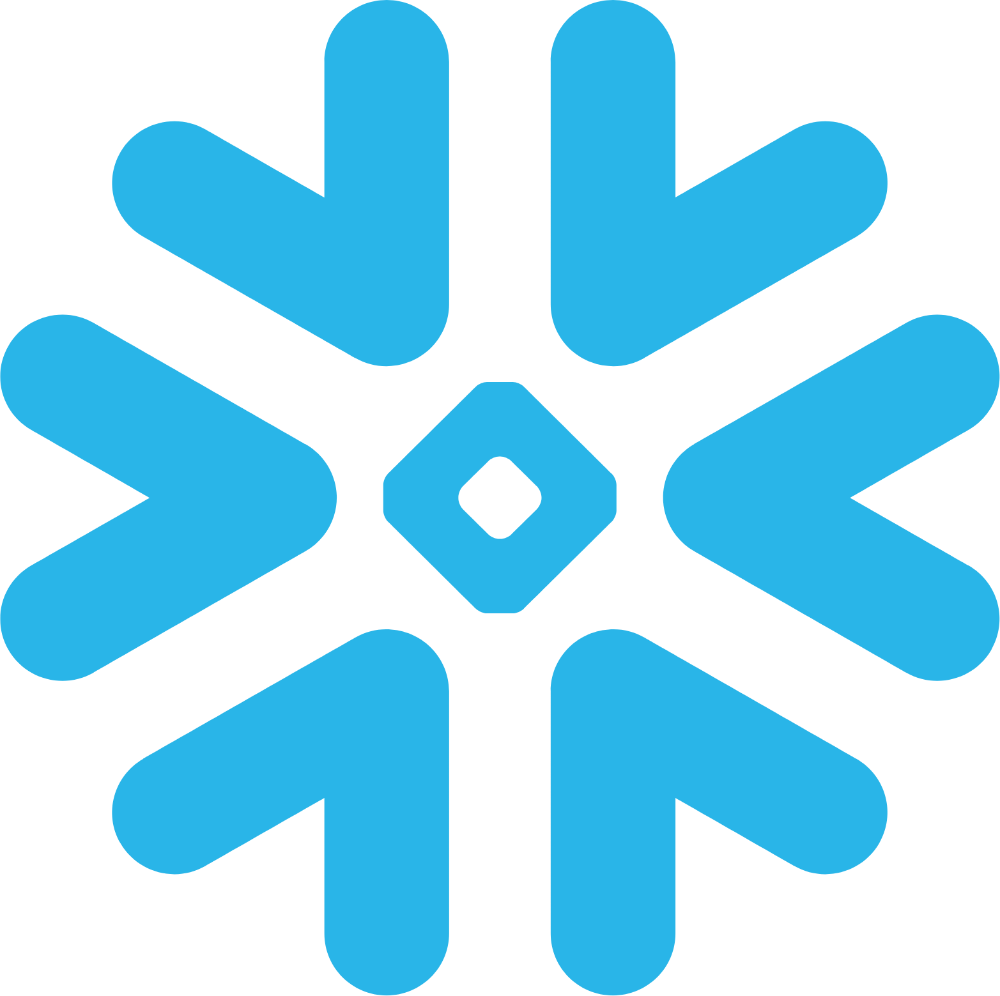

In [4]:
# : Explore the dataset

df

In [5]:
df['Has Table booking'] = df['Has Table booking'].apply(lambda x: 1 if x == 'Yes' else 0)
df['Has Online delivery'] = df['Has Online delivery'].apply(lambda x: 1 if x == 'Yes' else 0)

In [6]:
# Calculate the percentage of restaurants with table booking and online delivery

table_booking_percentage = (df['Has Table booking'].sum() / len(df)) * 100
online_delivery_percentage = (df['Has Online delivery'].sum() / len(df)) * 100

print(f"Percentage of restaurants offering table booking: {table_booking_percentage:.2f}%")
print(f"Percentage of restaurants offering online delivery: {online_delivery_percentage:.2f}%")

Percentage of restaurants offering table booking: 12.12%
Percentage of restaurants offering online delivery: 25.66%


In [7]:
# Analyze availability of online delivery among different price ranges

online_delivery_by_price_range = df.groupby('Price range')['Has Online delivery'].value_counts(normalize=True).unstack(fill_value=0) * 100


In [8]:
# Print summary


print(" Price range of Availability of online delivery:")
print(online_delivery_by_price_range)

 Price range of Availability of online delivery:
Has Online delivery          0          1
Price range                              
1                    84.225923  15.774077
2                    58.689367  41.310633
3                    70.809659  29.190341
4                    90.955631   9.044369


In [9]:


common_cuisines = df['Cuisines'].str.split(', ', expand=True).stack().value_counts().head(10)
print("Top 10 most common cuisines:")
print(common_cuisines)

Top 10 most common cuisines:
North Indian    3960
Chinese         2735
Fast Food       1986
Mughlai          995
Italian          764
Bakery           745
Continental      736
Cafe             703
Desserts         653
South Indian     636
Name: count, dtype: int64


In [10]:
restaurants_by_city = df['City'].value_counts().head(10)
print("Top 10 cities with the most restaurants:")
print(restaurants_by_city)

Top 10 cities with the most restaurants:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


In [11]:
average_cost_by_city = df.groupby('City')['Average Cost for two'].mean().sort_values(ascending=False).head(10)
print("Top 10 cities with the highest average cost for two person:")
print(average_cost_by_city)

Top 10 cities with the highest average cost for two person:
City
Jakarta             308437.500000
Tangerang           250000.000000
Bogor               160000.000000
Bandung             150000.000000
Pasay City            3333.333333
Colombo               2375.000000
Mandaluyong City      2000.000000
Panchkula             2000.000000
Taguig City           1725.000000
Hyderabad             1361.111111
Name: Average Cost for two, dtype: float64


In [12]:
unique_colors = df['Rating color'].unique()
print(unique_colors)

['Dark Green' 'Green' 'Yellow' 'Orange' 'White' 'Red']


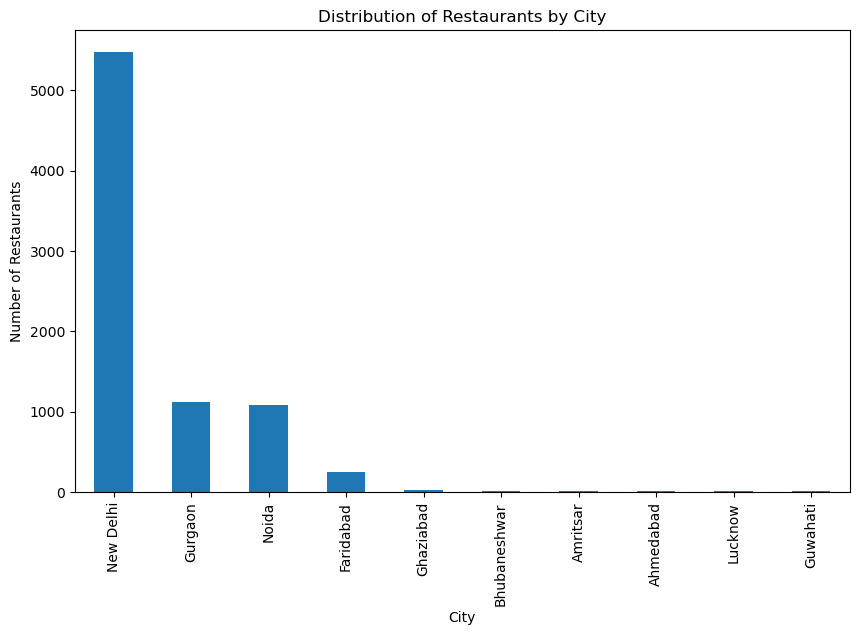

In [13]:
plt.figure(figsize=(10, 6))
restaurants_by_city.plot(kind='bar')
plt.title('Distribution of Restaurants by City')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.show()

Level 2 
Task 2

In [23]:
import seaborn as sns

In [14]:
df = pd.read_csv('Dataset.csv')



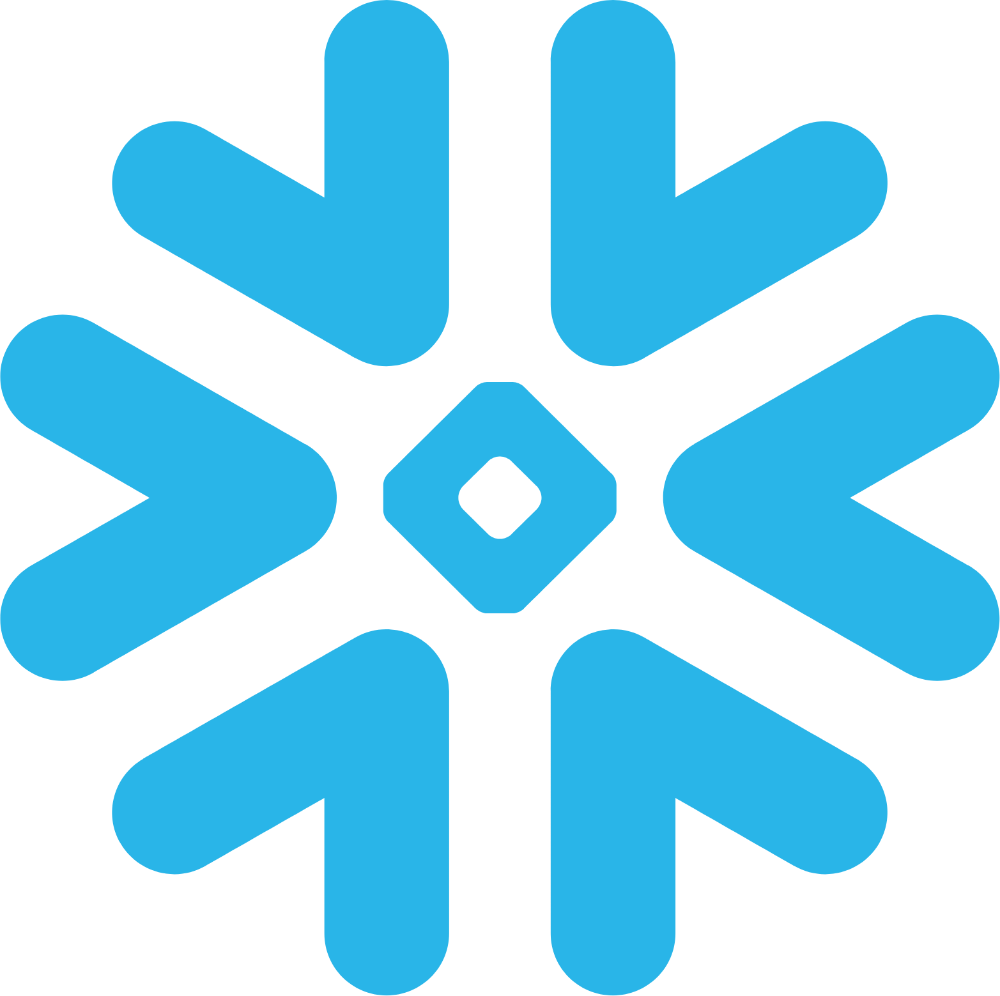

In [15]:
df


In [16]:
most_common_price_range = df['Price range'].mode()[0]
print(f"The most common price range is: {most_common_price_range}")

The most common price range is: 1


In [17]:
average_rating_by_price = df.groupby('Price range')['Aggregate rating'].mean().reset_index()
print("Average rating for each price range:")
print(average_rating_by_price)

Average rating for each price range:
   Price range  Aggregate rating
0            1          1.999887
1            2          2.941054
2            3          3.683381
3            4          3.817918


In [18]:
# Calculate the average rating by price range

average_rating_by_price = df.groupby('Price range')['Aggregate rating'].mean().reset_index()

# Find the highest average rating and its associated price range
highest_avg_rating_color = average_rating_by_price.sort_values(by='Aggregate rating', ascending=False).iloc[0]


# Print the result
print("The price range with the highest average rating is:", highest_avg_rating_color['Price range'])
print("The highest average rating in this price range is:", highest_avg_rating_color['Aggregate rating'])

The price range with the highest average rating is: 4.0
The highest average rating in this price range is: 3.8179180887372017


In [19]:
table_booking_percentage = (df['Has Table booking'] == 'Yes').mean() * 100
online_delivery_percentage = (df['Has Online delivery'] == 'Yes').mean() * 100

print(f"\nPercentage of restaurants that offer table booking: {table_booking_percentage:.2f}%")
print(f"Percentage of restaurants that offer online delivery: {online_delivery_percentage:.2f}%")


Percentage of restaurants that offer table booking: 12.12%
Percentage of restaurants that offer online delivery: 25.66%


In [20]:
avg_rating_with_table_booking = df[df['Has Table booking'] == 'Yes']['Aggregate rating'].mean()
avg_rating_without_table_booking = df[df['Has Table booking'] == 'No']['Aggregate rating'].mean()

print(f"\nAverage rating for restaurants with table booking: {avg_rating_with_table_booking:.2f}")
print(f"Average rating for restaurants without table booking: {avg_rating_without_table_booking:.2f}")



Average rating for restaurants with table booking: 3.44
Average rating for restaurants without table booking: 2.56


In [21]:
online_delivery_by_price = df.groupby('Price range')['Has Online delivery'].value_counts(normalize=True).unstack()
print("\nAvailability of online delivery among restaurants with different price ranges:")
print(online_delivery_by_price)


Availability of online delivery among restaurants with different price ranges:
Has Online delivery        No       Yes
Price range                            
1                    0.842259  0.157741
2                    0.586894  0.413106
3                    0.708097  0.291903
4                    0.909556  0.090444


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_10676\1197615687.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y='City', data=data_top_10, order=top_10_cities, palette="viridis")


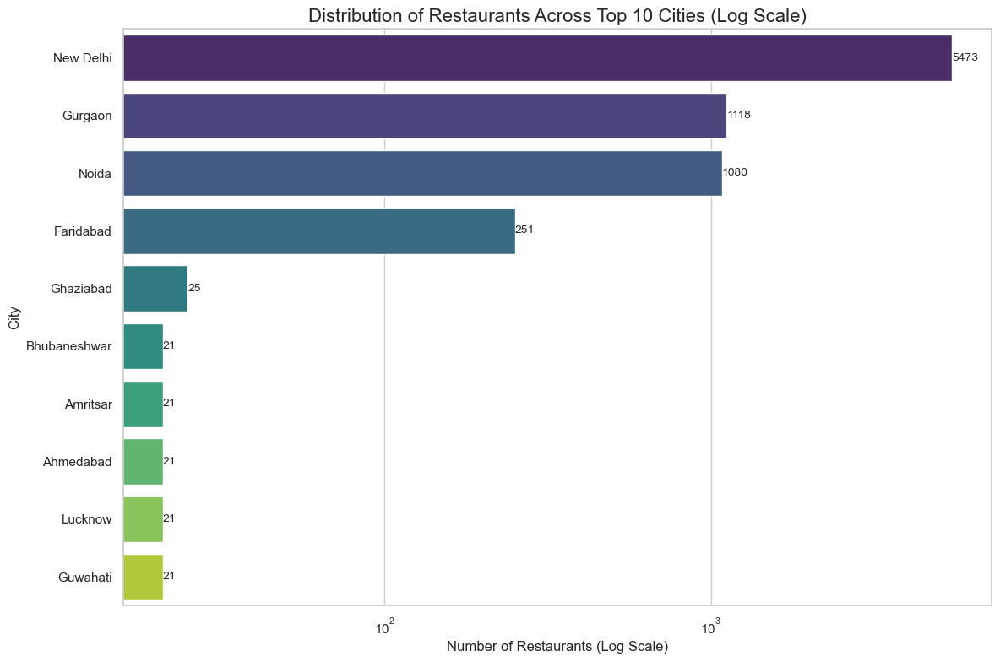

In [24]:
# Visualize 

# Select the top 10 cities
top_10_cities = df['City'].value_counts().head(10).index

# Filter the data to include only the top 10 cities
data_top_10 = df[df['City'].isin(top_10_cities)]

# Set a pleasant style for the plot
sns.set(style="whitegrid")

# Create a figure and axes with specified size
plt.figure(figsize=(12, 8))

# Create the countplot with log scale on the x-axis
ax = sns.countplot(y='City', data=data_top_10, order=top_10_cities, palette="viridis")
ax.set_xscale("log")  # Set the x-axis to log scale

# Add title and labels
plt.title('Distribution of Restaurants Across Top 10 Cities (Log Scale)', fontsize=16)
plt.xlabel('Number of Restaurants (Log Scale)', fontsize=12)
plt.ylabel('City', fontsize=12)

# Display the number of restaurants on top of each bar
for p in ax.patches:
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, f'{int(width)}', ha="left", va="center", fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

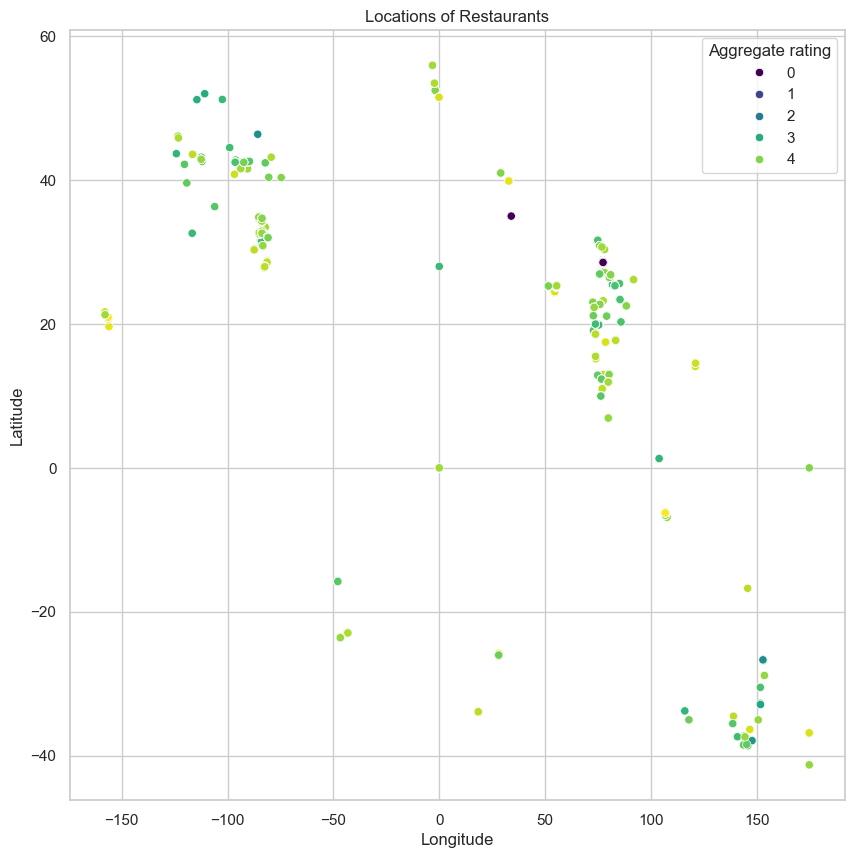

In [25]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x='Longitude', y='Latitude', data=df, hue='Aggregate rating', palette='viridis')
plt.title('Locations of Restaurants')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

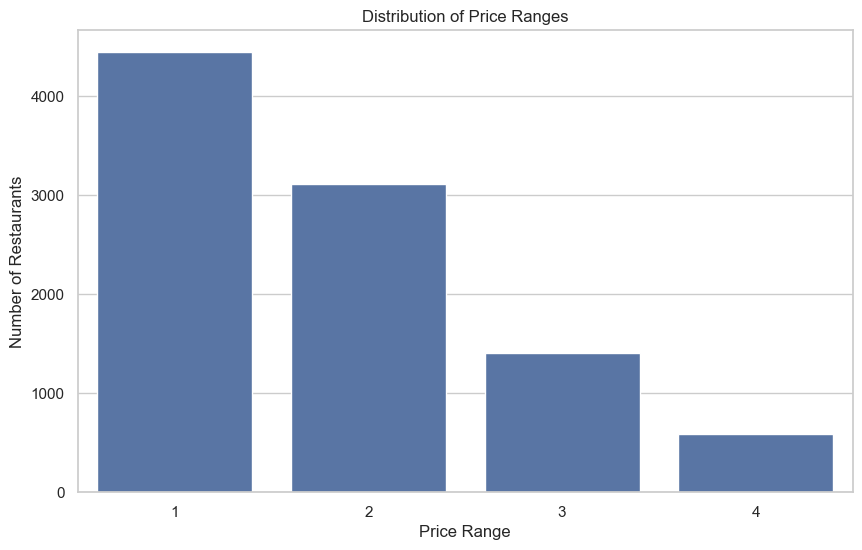

In [26]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Price range', data=df)
plt.title('Distribution of Price Ranges')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.show()

Text(0, 0.5, 'Average Rating')

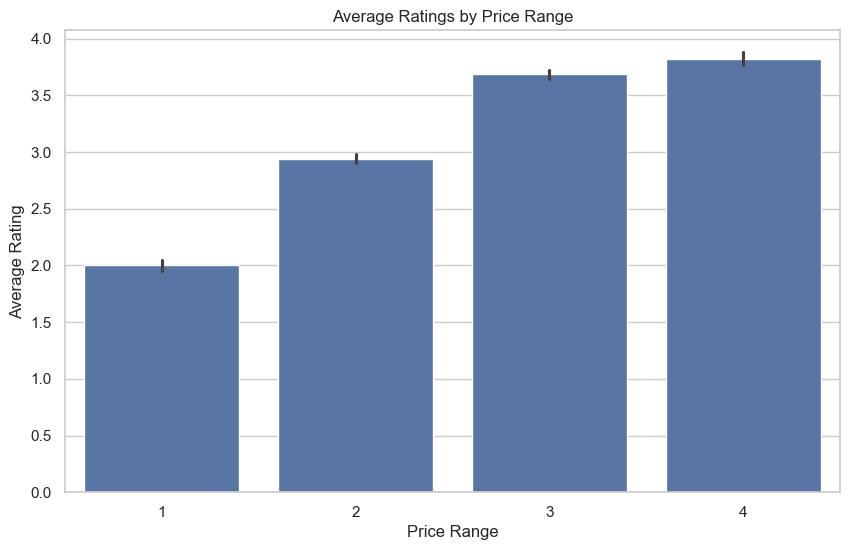

In [27]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Price range', y='Aggregate rating', data=df)
plt.title('Average Ratings by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Average Rating')

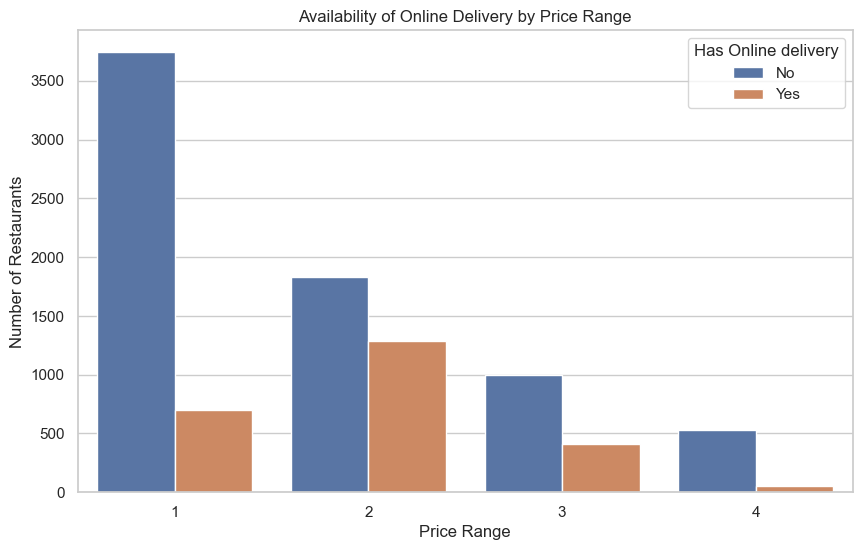

In [28]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Price range', hue='Has Online delivery', data=df)
plt.title('Availability of Online Delivery by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.show()


Level 3
Task-3 Feature Engineering

In [29]:
# Load  dataset
df = pd.read_csv('Dataset.csv')


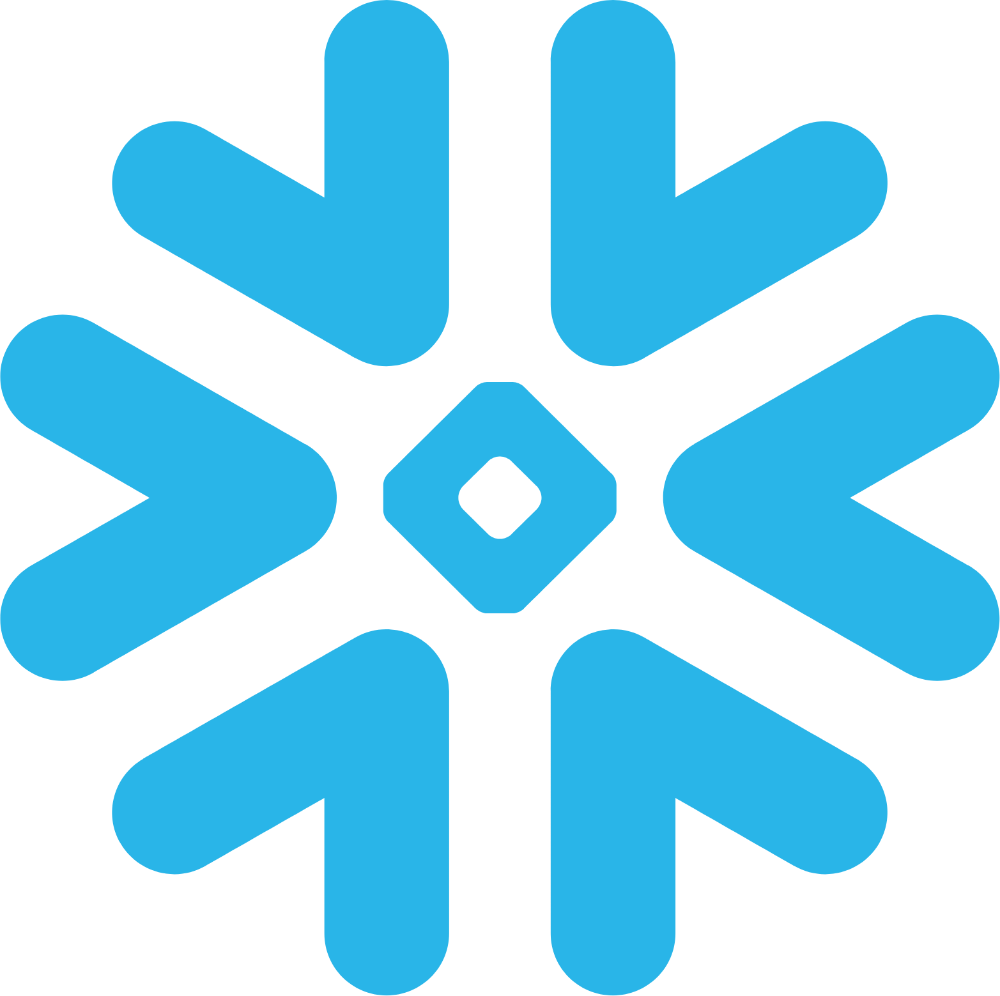

In [30]:
df

In [31]:
df['Restaurant Name Length'] = df['Restaurant Name'].apply(len)
df['Address Length'] = df['Address'].apply(len)

In [32]:
df['Has Table Booking'] = df['Has Table booking'].apply(lambda x: 1 if x == 'Yes' else 0)
df['Has Online Delivery'] = df['Has Online delivery'].apply(lambda x: 1 if x == 'Yes' else 0)

In [33]:
print(df.head())


   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [34]:
df['Has Table Booking'] = df['Has Table booking'].map({'Yes': 1, 'No': 0})
df['Has Online Delivery'] = df['Has Online delivery'].map({'Yes': 1, 'No': 0})

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_10676\2646246194.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='Price range', data=df, palette='viridis')


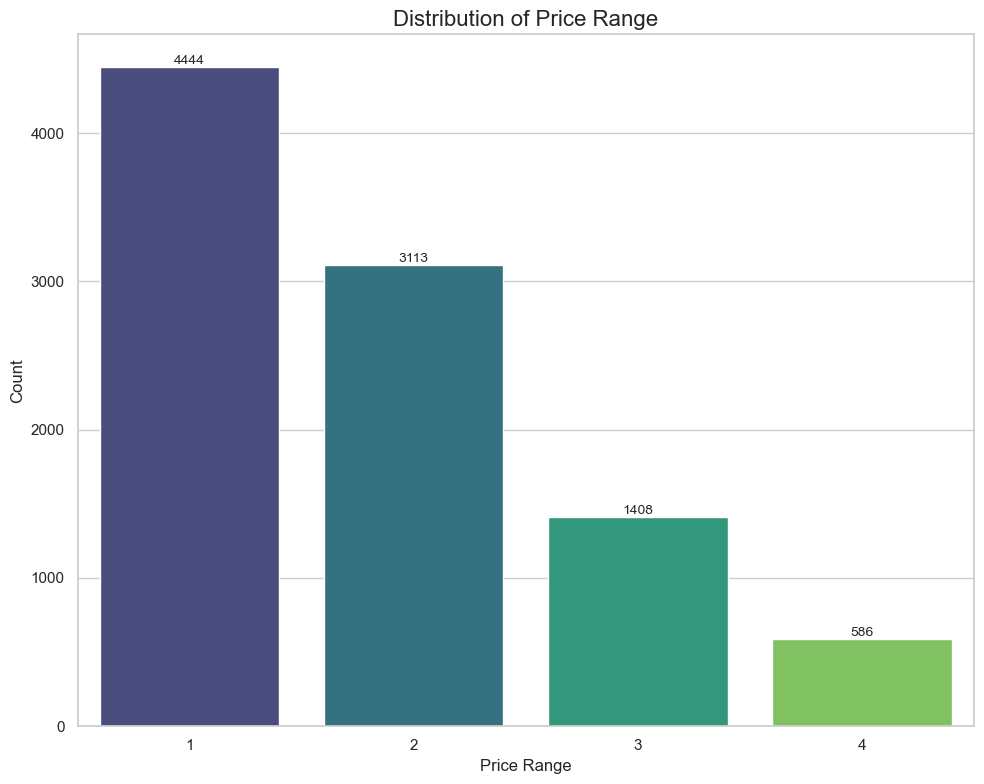

In [35]:
# Visualize 


# Set a pleasant style for the plot
sns.set_style("whitegrid")

# Create a figure and axes with specified size
plt.figure(figsize=(10, 8))

# Create the countplot with enhanced aesthetics
ax = sns.countplot(x='Price range', data=df, palette='viridis')

# Set title and labels
plt.title('Distribution of Price Range', fontsize=16)
plt.xlabel('Price Range', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Customize the appearance of the bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()



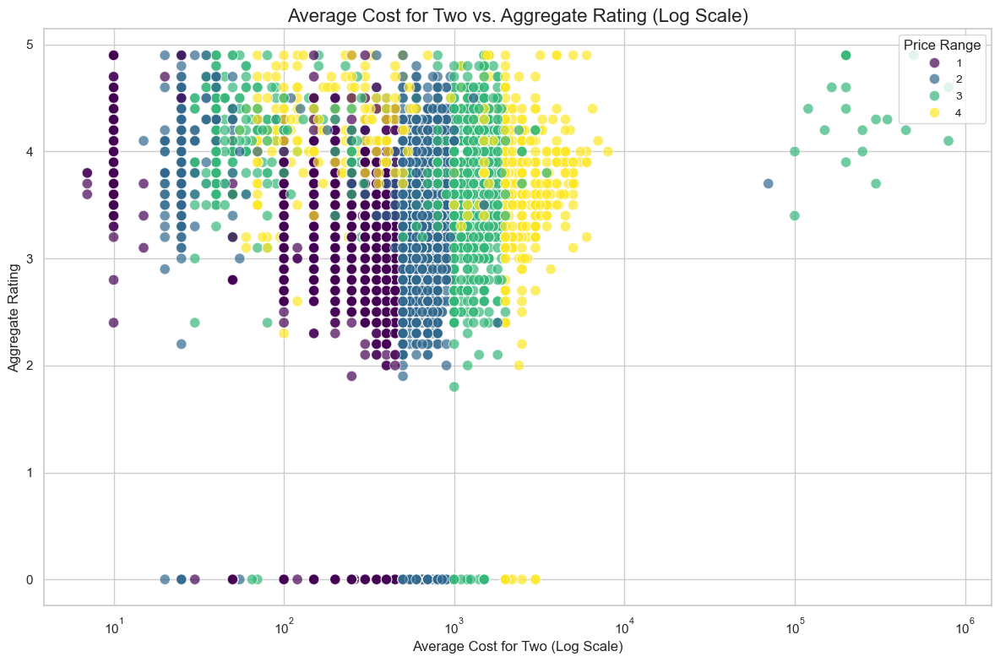

In [36]:
# Set a pleasant style for the plot
sns.set_style("whitegrid")

# Create a figure and axes with specified size
plt.figure(figsize=(12, 8))

# Create the scatter plot with enhanced aesthetics and log-scale for x-axis
sns.scatterplot(x='Average Cost for two', y='Aggregate rating', data=df, hue='Price range', palette='viridis', s=80, alpha=0.7)
plt.xscale("log")  # Set x-axis to log scale

# Set title and labels
plt.title('Average Cost for Two vs. Aggregate Rating (Log Scale)', fontsize=16)
plt.xlabel('Average Cost for Two (Log Scale)', fontsize=12)
plt.ylabel('Aggregate Rating', fontsize=12)

# Customize legend
plt.legend(title='Price Range', title_fontsize='12', loc='upper right', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

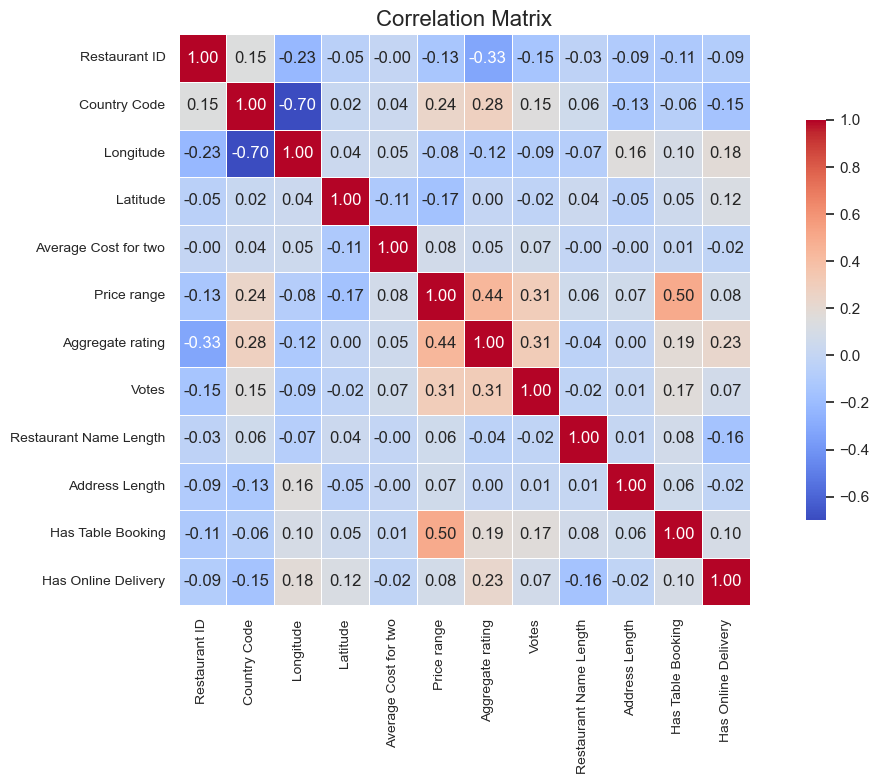

In [37]:
# Set a pleasant style for the plot
sns.set_style("whitegrid")

# Calculate the correlation matrix, specifying numeric_only=True
corr = df.corr(numeric_only=True)

# Create a figure and axes with specified size
plt.figure(figsize=(12, 8))

# Create the correlation heatmap with enhanced aesthetics
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=.5, fmt=".2f", square=True, cbar_kws={"shrink": 0.7})

# Set title and labels
plt.title('Correlation Matrix', fontsize=16)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

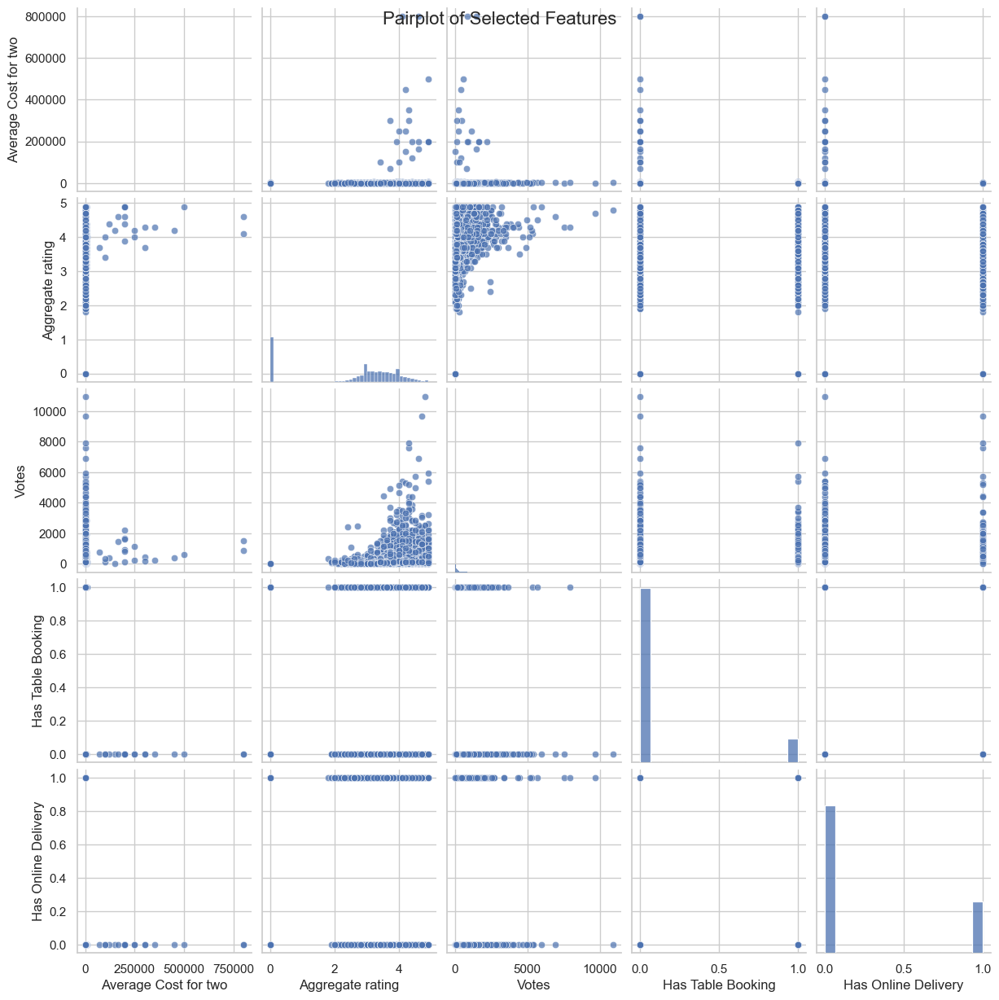

In [40]:
# Select the columns of interest
selected_columns = ['Average Cost for two', 'Aggregate rating', 'Votes', 'Has Table Booking', 'Has Online Delivery']
selected_data = df[selected_columns]

# Set a pleasant style for the plot
sns.set_style("whitegrid")

# Create a pairplot without specifying a palette
pairplot = sns.pairplot(selected_data, plot_kws={'alpha': 0.7})

# Customize the title
pairplot.fig.suptitle('Pairplot of Selected Features', fontsize=16)

# Show the plot
plt.show()